In [1]:
import cv2 as cv 
import numpy as np
import scipy
import PIL.Image
import math
import caffe
import time
from config_reader import config_reader
import util
import copy
import matplotlib
%matplotlib inline
import pylab as plt

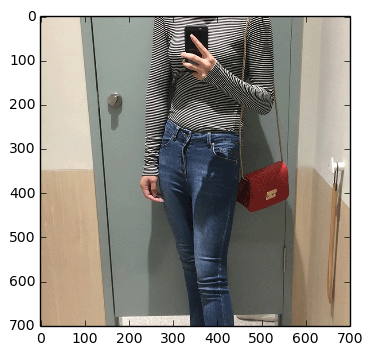

In [2]:
# test_image = '../sample_image/3.jpg'
# test_image = '../sample_image/upper.jpg'
test_image = '/home/yang/Workspace/Study/ML/test_data/test_data/img_crop/demo_nopass/11_11_F06W7310_1.png_corp_8.jpg'
oriImg = cv.imread(test_image) # B,G,R order
f = plt.imshow(oriImg[:,:,[2,1,0]]) # reorder it before displaying

In [3]:
param, model = config_reader()
multiplier = [0.9*x * model['boxsize'] / oriImg.shape[0] for x in param['scale_search']]
print multiplier

[0.2358974358974359, 0.4717948717948718, 0.7076923076923077, 0.9435897435897436]


In [4]:
print oriImg.shape

(702, 702, 3)


In [5]:
if param['use_gpu']: 
    caffe.set_mode_gpu()
    caffe.set_device(param['GPUdeviceNumber']) # set to your device!
else:
    caffe.set_mode_cpu()
net = caffe.Net(model['deployFile'], model['caffemodel'], caffe.TEST)

In [6]:
for i  in net.blobs:
    print i

data
conv1_1
conv1_2
pool1_stage1
conv2_1
conv2_2
pool2_stage1
conv3_1
conv3_2
conv3_3
conv3_4
pool3_stage1
conv4_1
conv4_2
conv4_3_CPM
conv4_4_CPM
conv4_4_CPM_relu4_4_CPM_0_split_0
conv4_4_CPM_relu4_4_CPM_0_split_1
conv4_4_CPM_relu4_4_CPM_0_split_2
conv4_4_CPM_relu4_4_CPM_0_split_3
conv4_4_CPM_relu4_4_CPM_0_split_4
conv4_4_CPM_relu4_4_CPM_0_split_5
conv4_4_CPM_relu4_4_CPM_0_split_6
conv5_1_CPM_L1
conv5_1_CPM_L2
conv5_2_CPM_L1
conv5_2_CPM_L2
conv5_3_CPM_L1
conv5_3_CPM_L2
conv5_4_CPM_L1
conv5_4_CPM_L2
conv5_5_CPM_L1
conv5_5_CPM_L2
concat_stage2
concat_stage2_concat_stage2_0_split_0
concat_stage2_concat_stage2_0_split_1
Mconv1_stage2_L1
Mconv1_stage2_L2
Mconv2_stage2_L1
Mconv2_stage2_L2
Mconv3_stage2_L1
Mconv3_stage2_L2
Mconv4_stage2_L1
Mconv4_stage2_L2
Mconv5_stage2_L1
Mconv5_stage2_L2
Mconv6_stage2_L1
Mconv6_stage2_L2
Mconv7_stage2_L1
Mconv7_stage2_L2
concat_stage3
concat_stage3_concat_stage3_0_split_0
concat_stage3_concat_stage3_0_split_1
Mconv1_stage3_L1
Mconv1_stage3_L2
Mconv2_stage

In [7]:
for i  in net.params:
    print i

conv1_1
conv1_2
conv2_1
conv2_2
conv3_1
conv3_2
conv3_3
conv3_4
conv4_1
conv4_2
conv4_3_CPM
conv4_4_CPM
conv5_1_CPM_L1
conv5_1_CPM_L2
conv5_2_CPM_L1
conv5_2_CPM_L2
conv5_3_CPM_L1
conv5_3_CPM_L2
conv5_4_CPM_L1
conv5_4_CPM_L2
conv5_5_CPM_L1
conv5_5_CPM_L2
Mconv1_stage2_L1
Mconv1_stage2_L2
Mconv2_stage2_L1
Mconv2_stage2_L2
Mconv3_stage2_L1
Mconv3_stage2_L2
Mconv4_stage2_L1
Mconv4_stage2_L2
Mconv5_stage2_L1
Mconv5_stage2_L2
Mconv6_stage2_L1
Mconv6_stage2_L2
Mconv7_stage2_L1
Mconv7_stage2_L2
Mconv1_stage3_L1
Mconv1_stage3_L2
Mconv2_stage3_L1
Mconv2_stage3_L2
Mconv3_stage3_L1
Mconv3_stage3_L2
Mconv4_stage3_L1
Mconv4_stage3_L2
Mconv5_stage3_L1
Mconv5_stage3_L2
Mconv6_stage3_L1
Mconv6_stage3_L2
Mconv7_stage3_L1
Mconv7_stage3_L2
Mconv1_stage4_L1
Mconv1_stage4_L2
Mconv2_stage4_L1
Mconv2_stage4_L2
Mconv3_stage4_L1
Mconv3_stage4_L2
Mconv4_stage4_L1
Mconv4_stage4_L2
Mconv5_stage4_L1
Mconv5_stage4_L2
Mconv6_stage4_L1
Mconv6_stage4_L2
Mconv7_stage4_L1
Mconv7_stage4_L2
Mconv1_stage5_L1
Mconv1_stage5_L

-----------------------------------------------------------
scale:	0.235897435897
(166, 166, 3)
-----------------------------------------------------------
(168, 168, 3)
[0, 0, 2, 2]
At scale 0, The CNN took 525.91 ms.
output_blobs.keys()	['Mconv7_stage6_L1', 'Mconv7_stage6_L2']
net.blobs[output_blobs.keys()[1]].data	(1, 19, 21, 21)
np.squeeze(net.blobs[output_blobs.keys()[1]].data)	(19, 21, 21)
model['stride']	8
heatmap:	(702, 702, 19)
('output paf shape:', (21, 21, 38))
-----------------------------------------------------------
scale:	0.471794871795
(331, 331, 3)
-----------------------------------------------------------
(336, 336, 3)
[0, 0, 5, 5]
At scale 1, The CNN took 1191.94 ms.
output_blobs.keys()	['Mconv7_stage6_L1', 'Mconv7_stage6_L2']
net.blobs[output_blobs.keys()[1]].data	(1, 19, 42, 42)
np.squeeze(net.blobs[output_blobs.keys()[1]].data)	(19, 42, 42)
model['stride']	8
heatmap:	(702, 702, 19)
('output paf shape:', (42, 42, 38))
---------------------------------------------

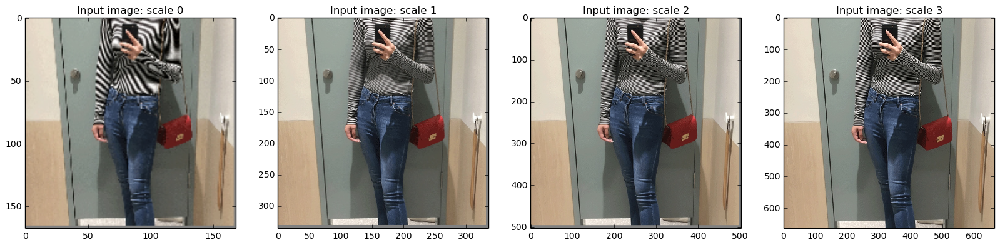

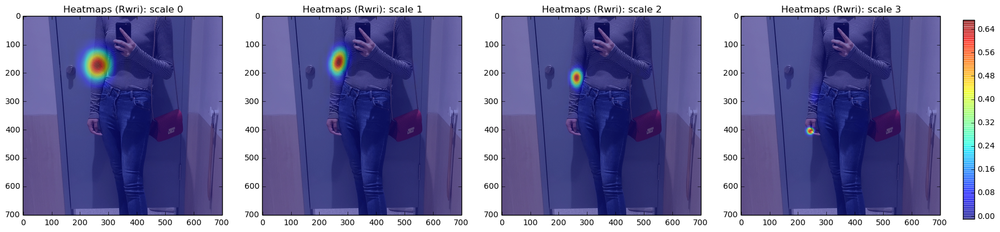

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [8]:
heatmap_avg = np.zeros((oriImg.shape[0], oriImg.shape[1], 19))
paf_avg = np.zeros((oriImg.shape[0], oriImg.shape[1], 38))
# first figure shows padded images
f, axarr = plt.subplots(1, len(multiplier))
f.set_size_inches((20, 5))
# second figure shows heatmaps
f2, axarr2 = plt.subplots(1, len(multiplier))
f2.set_size_inches((20, 5))
# third figure shows PAFs
f3, axarr3 = plt.subplots(2, len(multiplier))
f3.set_size_inches((20, 10))

for m in range(len(multiplier)):
    scale = multiplier[m]
    imageToTest = cv.resize(oriImg, (0,0), fx=scale, fy=scale, interpolation=cv.INTER_CUBIC)
    print "-----------------------------------------------------------"
    print "scale:\t{}".format(scale)
    print imageToTest.shape
    print "-----------------------------------------------------------"
    imageToTest_padded, pad = util.padRightDownCorner(imageToTest, model['stride'], model['padValue'])
    print imageToTest_padded.shape
    print pad
    
    axarr[m].imshow(imageToTest_padded[:,:,[2,1,0]])
    axarr[m].set_title('Input image: scale %d' % m)

    net.blobs['data'].reshape(*(1, 3, imageToTest_padded.shape[0], imageToTest_padded.shape[1]))
    #net.forward() # dry run
    net.blobs['data'].data[...] = np.transpose(np.float32(imageToTest_padded[:,:,:,np.newaxis]), (3,2,0,1))/256 - 0.5;
    start_time = time.time()
    output_blobs = net.forward()
    print('At scale %d, The CNN took %.2f ms.' % (m, 1000 * (time.time() - start_time)))

    # extract outputs, resize, and remove padding
    print "output_blobs.keys()\t{}".format(output_blobs.keys())
    print "net.blobs[output_blobs.keys()[1]].data\t{}".format(net.blobs[output_blobs.keys()[1]].data.shape)
    print "np.squeeze(net.blobs[output_blobs.keys()[1]].data)\t{}".format(np.squeeze(net.blobs[output_blobs.keys()[1]].data).shape)
    print "model['stride']\t{}".format(model['stride']) #原图大小与最终的feature map 差的倍数
    heatmap = np.transpose(np.squeeze(net.blobs[output_blobs.keys()[1]].data), (1,2,0)) # output 1 is heatmaps
    heatmap = cv.resize(heatmap, (0,0), fx=model['stride'], fy=model['stride'], interpolation=cv.INTER_CUBIC)
    heatmap = heatmap[:imageToTest_padded.shape[0]-pad[2], :imageToTest_padded.shape[1]-pad[3], :]
    heatmap = cv.resize(heatmap, (oriImg.shape[1], oriImg.shape[0]), interpolation=cv.INTER_CUBIC)
    print "heatmap:\t{}".format(heatmap.shape)
    
    paf = np.transpose(np.squeeze(net.blobs[output_blobs.keys()[0]].data), (1,2,0)) # output 0 is PAFs
    print('output paf shape:', paf.shape)
    paf = cv.resize(paf, (0,0), fx=model['stride'], fy=model['stride'], interpolation=cv.INTER_CUBIC)
    paf = paf[:imageToTest_padded.shape[0]-pad[2], :imageToTest_padded.shape[1]-pad[3], :]
    paf = cv.resize(paf, (oriImg.shape[1], oriImg.shape[0]), interpolation=cv.INTER_CUBIC)
    
    # visualization
    axarr2[m].imshow(oriImg[:,:,[2,1,0]])
    ax2 = axarr2[m].imshow(heatmap[:,:,3], alpha=.5) # right wrist
    axarr2[m].set_title('Heatmaps (Rwri): scale %d' % m)
    
    axarr3.flat[m].imshow(oriImg[:,:,[2,1,0]])
    ax3x = axarr3.flat[m].imshow(paf[:,:,16], alpha=.5) # right elbow
    axarr3.flat[m].set_title('PAFs (x comp. of Rwri to Relb): scale %d' % m)
    axarr3.flat[len(multiplier) + m].imshow(oriImg[:,:,[2,1,0]])
    ax3y = axarr3.flat[len(multiplier) + m].imshow(paf[:,:,17], alpha=.5) # right wrist
    axarr3.flat[len(multiplier) + m].set_title('PAFs (y comp. of Relb to Rwri): scale %d' % m)
    
    heatmap_avg = heatmap_avg + heatmap / len(multiplier)
    paf_avg = paf_avg + paf / len(multiplier)
    
    print "===================================================================="

f2.subplots_adjust(right=0.93)
cbar_ax = f2.add_axes([0.95, 0.15, 0.01, 0.7])
_ = f2.colorbar(ax2, cax=cbar_ax)

f3.subplots_adjust(right=0.93)
cbar_axx = f3.add_axes([0.95, 0.57, 0.01, 0.3])
_ = f3.colorbar(ax3x, cax=cbar_axx)
cbar_axy = f3.add_axes([0.95, 0.15, 0.01, 0.3])
_ = f3.colorbar(ax3y, cax=cbar_axy)

In [9]:
print paf_avg.shape
print paf_avg

(702, 702, 38)
[[[  2.33413753e-04  -4.86221679e-05  -1.04948022e-04 ...,   7.57123198e-05
     8.90979281e-05   7.06767787e-05]
  [  2.33413753e-04  -4.86221670e-05  -1.04948023e-04 ...,   7.57123198e-05
     8.90979300e-05   7.06767805e-05]
  [  2.33413753e-04  -4.86221679e-05  -1.04948027e-04 ...,   7.57123198e-05
     8.90979263e-05   7.06767787e-05]
  ..., 
  [  2.33417333e-04  -4.86077497e-05  -1.04947558e-04 ...,   7.57124108e-05
     8.90982847e-05   7.06768078e-05]
  [  2.33413761e-04  -4.86221652e-05  -1.04948025e-04 ...,   7.57123162e-05
     8.90979300e-05   7.06767787e-05]
  [  2.33413746e-04  -4.86221652e-05  -1.04948022e-04 ...,   7.57123198e-05
     8.90979281e-05   7.06767787e-05]]

 [[  2.33413750e-04  -4.86221679e-05  -1.04948022e-04 ...,   7.57123162e-05
     8.90979263e-05   7.06767860e-05]
  [  2.33413750e-04  -4.86221670e-05  -1.04948022e-04 ...,   7.57123162e-05
     8.90979281e-05   7.06767860e-05]
  [  2.33413743e-04  -4.86221679e-05  -1.04948022e-04 ...,   7.

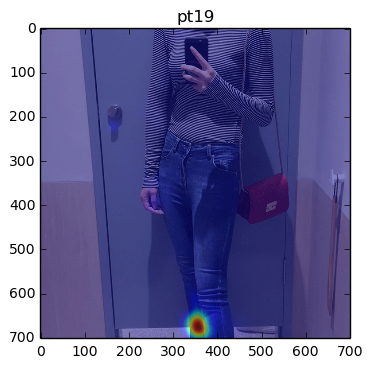

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [10]:
body_str=["nose", "neck", "R_shoulder", "R_elbow", "R_wrist", "L_shoulder", "L_elbow", "L_wrist",
 "R_hip", "R_knee", "R_ankle", "L_hip", "L_knee", "L_ank", "L_eye", "R_eye", "L_ear", "R_ear", "pt19"]
plt.imshow(oriImg[:,:,[2,1,0]])
plt.imshow(heatmap_avg[:,:, 10], alpha=0.5)
plt.title(body_str[-1])
plt.show()

f5, axarr5 = plt.subplots(19,3)
f5.set_size_inches((20, 200))

for i in range(paf_avg.shape[-1]/2):
    axarr5.flat[i*3+0].imshow(oriImg[:,:,[2,1,0]])
    axarr5.flat[i*3+0].imshow(paf_avg[:,:,i*2], alpha=.5)
    axarr5.flat[i*3+0].set_title(str(i)+"_x component")
    axarr5.flat[i*3+1].imshow(oriImg[:,:,[2,1,0]])
    axarr5.flat[i*3+1].imshow(paf_avg[:,:,i*2+1], alpha=.5)
    axarr5.flat[i*3+1].set_title(str(i)+"_y component")
    axarr5.flat[i*3+2].imshow(oriImg[:,:,[2,1,0]])
    axarr5.flat[i*3+2].imshow(heatmap_avg[:,:,i], alpha=.5)
    axarr5.flat[i*3+2].set_title(body_str[i])
plt.show()

Let's have a closer look on those averaged heatmaps and PAFs!

In [9]:
plt.imshow(oriImg[:,:,[2,1,0]])
plt.imshow(heatmap_avg[:,:,2], alpha=.5)
fig = matplotlib.pyplot.gcf()
cax = matplotlib.pyplot.gca()
fig.set_size_inches(20, 20)
fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.15, 0.01, 0.7])
_ = fig.colorbar(ax2, cax=cbar_ax)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


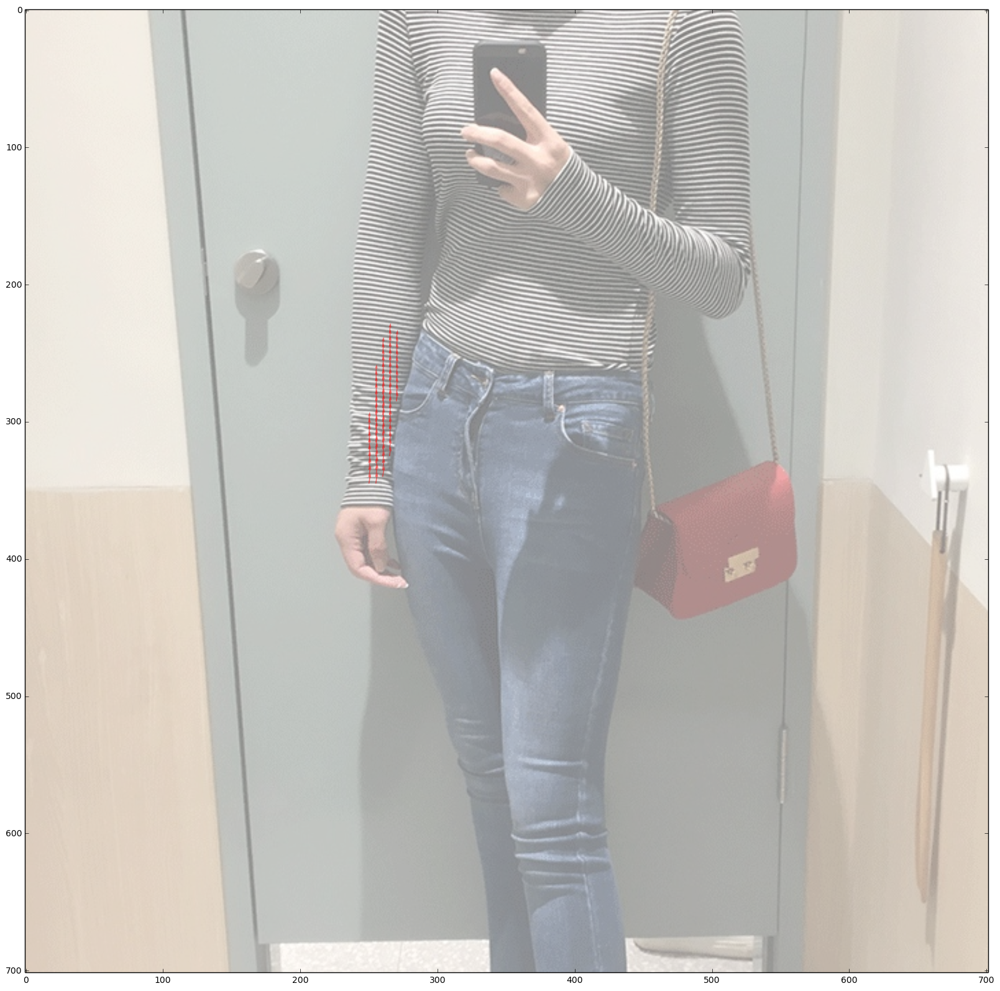

In [10]:
from numpy import ma
U = paf_avg[:,:,16] * -1
V = paf_avg[:,:,17]
X, Y = np.meshgrid(np.arange(U.shape[1]), np.arange(U.shape[0]))
M = np.zeros(U.shape, dtype='bool')
M[U**2 + V**2 < 0.5 * 0.5] = True
U = ma.masked_array(U, mask=M)
V = ma.masked_array(V, mask=M)

# 1
plt.figure()
plt.imshow(oriImg[:,:,[2,1,0]], alpha = .5)
s = 5
Q = plt.quiver(X[::s,::s], Y[::s,::s], U[::s,::s], V[::s,::s], 
               scale=50, headaxislength=4, alpha=.5, width=0.001, color='r')

fig = matplotlib.pyplot.gcf()
fig.set_size_inches(20, 20)

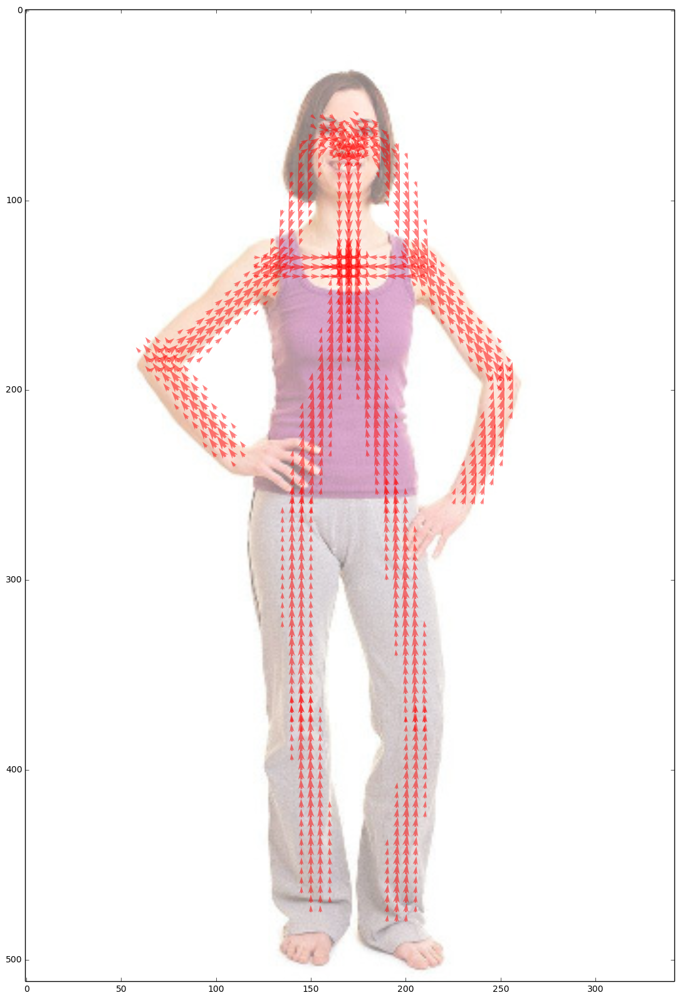

In [12]:
from numpy import ma
# 1
plt.figure()
plt.imshow(oriImg[:,:,[2,1,0]], alpha = .5)
s = 5
for i in range(19):
    U = paf_avg[:,:,i*2] * -1
    V = paf_avg[:,:,i*2+1]
    X, Y = np.meshgrid(np.arange(U.shape[1]), np.arange(U.shape[0]))
    M = np.zeros(U.shape, dtype='bool')
    M[U**2 + V**2 < 0.5 * 0.5] = True
    U = ma.masked_array(U, mask=M)
    V = ma.masked_array(V, mask=M)

    Q = plt.quiver(X[::s,::s], Y[::s,::s], U[::s,::s], V[::s,::s], 
                   scale=50, headaxislength=4, alpha=.5, width=0.005, color='r')

fig = matplotlib.pyplot.gcf()
fig.set_size_inches(20, 20)

(702, 702, 19)
(array([], dtype=int64), array([], dtype=int64))
[]
[]
[]
[]
(array([4]), array([390]))
[(390, 4)]
[(390, 4, 0.19859068643813771)]
[0]
[(390, 4, 0.19859068643813771, 0)]
(array([  1, 375]), array([299, 235]))
[(299, 1), (235, 375)]
[(299, 1, 0.21461049659410492), (235, 375, 0.1610780846713169)]
[1, 2]
[(299, 1, 0.21461049659410492, 1), (235, 375, 0.1610780846713169, 2)]
(array([174, 406]), array([264, 243]))
[(264, 174), (243, 406)]
[(264, 174, 0.27645447487884667), (243, 406, 0.16803417615665239)]
[3, 4]
[(264, 174, 0.27645447487884667, 3), (243, 406, 0.16803417615665239, 4)]
(array([339, 414]), array([248, 261]))
[(248, 339), (261, 414)]
[(248, 339, 0.65853213518857956), (261, 414, 0.17409268715709914)]
[5, 6]
[(248, 339, 0.65853213518857956, 5), (261, 414, 0.17409268715709914, 6)]
(array([0]), array([478]))
[(478, 0)]
[(478, 0, 0.18549731819075532)]
[7]
[(478, 0, 0.18549731819075532, 7)]
(array([198]), array([512]))
[(512, 198)]
[(512, 198, 0.63344907760620117)]
[8]
[

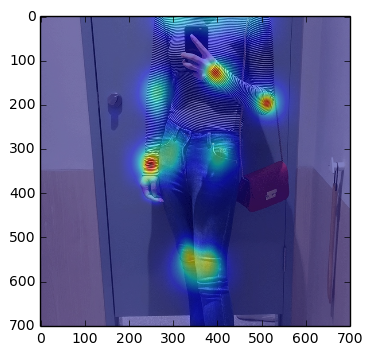

In [11]:
import scipy
print heatmap_avg.shape

#plt.imshow(heatmap_avg[:,:,2])
from scipy.ndimage.filters import gaussian_filter
all_peaks = []
peak_counter = 0

for part in range(19-1):
    x_list = []
    y_list = []
    map_ori = heatmap_avg[:,:,part]
    map = gaussian_filter(map_ori, sigma=3)
    
    map_left = np.zeros(map.shape)
    map_left[1:,:] = map[:-1,:]
    map_right = np.zeros(map.shape)
    map_right[:-1,:] = map[1:,:]
    map_up = np.zeros(map.shape)
    map_up[:,1:] = map[:,:-1]
    map_down = np.zeros(map.shape)
    map_down[:,:-1] = map[:,1:]
    
    peaks_binary = np.logical_and.reduce((map>=map_left, map>=map_right, map>=map_up, map>=map_down, map > param['thre1']))
    peaks = zip(np.nonzero(peaks_binary)[1], np.nonzero(peaks_binary)[0]) # note reverse
    peaks_with_score = [x + (map_ori[x[1],x[0]],) for x in peaks]
    id = range(peak_counter, peak_counter + len(peaks))
    peaks_with_score_and_id = [peaks_with_score[i] + (id[i],) for i in range(len(id))]

    all_peaks.append(peaks_with_score_and_id)
    peak_counter += len(peaks)
    plt.imshow(oriImg[:,:,[2,1,0]])
#     plt.imshow(map, alpha=.5)
    if part ==0:
        show_map = map
    else :
        show_map +=map
    
#     print peaks_binary 
    print np.nonzero(peaks_binary)
    print peaks
    print peaks_with_score
    print id
    print peaks_with_score_and_id
    print "==============================================="
plt.imshow(show_map, alpha=.5)
#     if part==3:
#         #plt.imshow(map)
#         plt.imshow(oriImg[:,:,[2,1,0]])
#         plt.imshow(map, alpha=.5)
#         print peaks_with_score_and_id

(702, 702, 19)
(array([  0,   0,   0,   0,   3,   3,   6,  13,  43,  49,  51,  77,  80,
        82,  90,  92,  98, 100, 100, 108, 124, 127, 131, 135, 136, 136,
       137, 138, 141, 144, 148, 152, 155, 157, 159, 166, 169, 178, 179,
       180, 184, 191, 199, 200, 204, 205, 206, 211, 212, 216, 218, 222,
       222, 222, 227, 228, 247, 248, 248, 249, 255, 257, 258, 258, 259,
       260, 265, 272, 276, 279, 284, 286, 287, 289, 292, 293, 299, 308,
       309, 310, 311, 317, 319, 319, 323, 327, 333, 338, 338, 339, 340,
       342, 355, 358, 361, 364, 367, 368, 368, 371, 372, 377, 381, 386,
       389, 391, 393, 400, 401, 403, 406, 408, 409, 411, 414, 414, 420,
       426, 429, 433, 435, 436, 437, 438, 440, 441, 441, 442, 443, 451,
       457, 461, 462, 462, 462, 463, 473, 473, 480, 481, 493, 497, 498,
       499, 501, 501, 509, 511, 512, 518, 524, 530, 531, 535, 553, 554,
       561, 562, 563, 564, 565, 565, 568, 569, 572, 577, 578, 591, 591,
       596, 597, 601, 611, 615, 615, 615, 616, 6

(array([  0,   0,   0,   0,   3,   3,   3,   9,  70,  77,  82,  82,  93,
        96, 100, 106, 109, 116, 117, 118, 133, 135, 139, 145, 153, 154,
       155, 155, 156, 165, 166, 166, 167, 167, 178, 180, 191, 192, 196,
       200, 203, 204, 205, 205, 206, 208, 218, 218, 222, 229, 230, 230,
       231, 233, 248, 272, 275, 275, 280, 281, 281, 282, 282, 284, 287,
       301, 308, 314, 317, 319, 322, 327, 337, 350, 361, 362, 362, 372,
       372, 376, 389, 390, 401, 405, 409, 420, 420, 429, 443, 443, 446,
       452, 454, 455, 461, 461, 462, 465, 466, 472, 475, 476, 478, 487,
       487, 495, 500, 501, 512, 513, 513, 518, 519, 529, 530, 533, 552,
       554, 558, 559, 562, 564, 564, 564, 565, 565, 566, 566, 570, 591,
       593, 593, 595, 597, 611, 612, 615, 620, 621, 625, 631, 632, 638,
       651, 654, 657, 658, 672, 698, 698, 698, 698, 698, 698, 701, 701, 701]), array([262, 291, 499, 534, 143, 398, 562, 701,  76,   7, 513, 603,  77,
       328, 331, 657, 481, 301, 300, 338, 293, 691, 399,

(array([  0,   0,   0,   0,   3,   3,   3,   3,   9,  75,  81,  82,  84,
       100, 105, 112, 114, 122, 149, 150, 164, 173, 178, 191, 195, 196,
       197, 199, 202, 203, 204, 204, 204, 210, 222, 222, 229, 231, 248,
       261, 262, 265, 279, 290, 310, 317, 321, 327, 341, 343, 348, 353,
       356, 375, 379, 393, 397, 401, 401, 401, 402, 407, 408, 408, 409,
       414, 420, 422, 422, 429, 434, 434, 435, 437, 439, 440, 441, 441,
       443, 444, 452, 462, 468, 473, 476, 482, 505, 509, 513, 529, 530,
       534, 549, 554, 554, 555, 556, 561, 562, 564, 564, 564, 565, 591,
       592, 594, 595, 596, 602, 611, 613, 616, 619, 620, 621, 624, 624,
       628, 641, 653, 665, 669, 698, 698, 698, 698, 698, 701, 701]), array([  0, 269, 498, 701,  67, 171, 391, 554, 635,   7, 600, 601, 526,
       160, 233, 321, 633, 390, 131, 199, 468,  75,  56, 188, 498,  66,
       165, 223, 510, 304,   8, 305, 592,  52,   8,  54, 170, 582,  39,
       530, 531, 138, 391, 452, 355,  17, 104,  75, 249, 445, 550,

(array([  0,   0,   0,   0,   3,   3,   4,   5,   6,   8,  13,  50,  70,
        71,  75,  78, 100, 103, 130, 132, 141, 142, 147, 171, 178, 181,
       186, 187, 190, 195, 196, 196, 199, 204, 209, 220, 222, 222, 231,
       233, 240, 248, 265, 268, 277, 283, 297, 317, 327, 330, 341, 349,
       350, 375, 378, 383, 383, 386, 396, 397, 401, 402, 402, 403, 405,
       407, 409, 420, 429, 433, 435, 440, 441, 443, 452, 460, 462, 468,
       473, 477, 480, 513, 515, 528, 529, 529, 534, 537, 548, 554, 555,
       556, 557, 559, 562, 563, 564, 565, 568, 570, 572, 579, 592, 595,
       595, 601, 602, 603, 610, 611, 611, 612, 615, 616, 619, 623, 627,
       630, 635, 643, 646, 654, 663, 667, 674, 681, 696, 697, 698, 698,
       698, 698, 701, 701, 701, 701, 701]), array([  0, 255, 383, 701,  64, 534, 455, 634, 256, 257, 383, 290, 511,
       510,   7, 599, 569, 292, 605, 395, 133, 132, 180,  75,  56, 263,
        75, 523, 500, 164,  68, 565, 319,   7, 308,  84,  11,  54, 170,
        85, 602,  3

(array([  0,   0,   0,   0,   3,   3,   3,   5,   6,   7,  14,  35,  49,
        71,  72,  73,  83,  84,  98, 103, 120, 122, 133, 136, 144, 146,
       147, 147, 149, 157, 160, 163, 163, 164, 172, 175, 178, 180, 180,
       182, 183, 199, 200, 200, 205, 211, 212, 212, 216, 222, 222, 229,
       231, 233, 235, 236, 238, 248, 248, 264, 267, 276, 279, 291, 295,
       296, 302, 309, 311, 313, 317, 322, 324, 327, 346, 352, 355, 357,
       358, 360, 386, 393, 394, 395, 396, 399, 400, 401, 402, 403, 404,
       404, 405, 420, 429, 434, 435, 437, 439, 443, 444, 446, 457, 460,
       462, 470, 473, 475, 475, 497, 502, 505, 510, 513, 524, 528, 533,
       534, 537, 538, 554, 554, 555, 556, 557, 560, 564, 565, 588, 592,
       592, 594, 594, 595, 597, 602, 603, 607, 611, 616, 619, 629, 653,
       655, 656, 667, 698, 698, 698, 698, 698, 701, 701, 701, 701, 701]), array([  0, 136, 319, 692,  71, 197, 564, 415, 477, 272, 634, 134, 353,
        70,  71,   7, 351, 323, 188, 615, 629, 394, 529, 516,

(array([  0,   0,   3,   3,   5,  12,  49,  71,  76,  77,  79,  80,  81,
       103, 104, 114, 123, 124, 126, 130, 132, 133, 140, 141, 162, 163,
       167, 176, 178, 184, 186, 196, 197, 197, 202, 204, 211, 222, 230,
       230, 236, 245, 248, 248, 262, 263, 264, 265, 266, 269, 272, 273,
       274, 284, 289, 294, 300, 306, 315, 317, 323, 327, 327, 329, 342,
       342, 343, 353, 354, 358, 358, 383, 383, 391, 391, 394, 394, 394,
       395, 401, 401, 401, 402, 405, 414, 415, 420, 420, 422, 423, 424,
       429, 430, 431, 431, 432, 441, 442, 443, 449, 462, 465, 469, 473,
       476, 476, 481, 495, 496, 496, 506, 506, 506, 514, 519, 519, 523,
       526, 527, 528, 535, 535, 554, 555, 555, 556, 561, 562, 564, 567,
       593, 596, 598, 599, 600, 600, 601, 606, 611, 616, 619, 620, 622,
       629, 647, 648, 651, 656, 661, 670, 698, 698, 698, 698, 698, 701]), array([318, 409, 191, 564, 475, 265, 350,   7, 514, 445, 349, 348, 600,
       478, 577, 315, 628, 615, 370, 415, 507, 508, 134, 133,

(array([  0,   3,   3,   3,   3,   3,   3,   6,  14,  40,  41,  42,  68,
        70,  77,  80,  90,  94, 104, 106, 109, 111, 113, 113, 114, 115,
       116, 122, 124, 125, 125, 125, 126, 131, 134, 139, 140, 141, 143,
       146, 147, 149, 156, 164, 169, 171, 177, 178, 197, 199, 202, 204,
       204, 204, 209, 215, 216, 216, 217, 218, 218, 222, 222, 222, 248,
       254, 255, 261, 265, 277, 278, 278, 280, 286, 286, 288, 294, 301,
       312, 317, 320, 322, 325, 326, 326, 327, 327, 328, 330, 334, 342,
       348, 349, 350, 355, 356, 363, 363, 364, 368, 369, 371, 375, 375,
       377, 383, 383, 386, 386, 391, 394, 396, 398, 399, 399, 401, 402,
       403, 404, 407, 414, 420, 421, 422, 422, 424, 429, 431, 434, 436,
       443, 443, 443, 444, 447, 448, 448, 449, 451, 453, 454, 456, 459,
       462, 462, 473, 479, 479, 480, 481, 482, 489, 495, 496, 500, 503,
       504, 509, 511, 511, 512, 512, 512, 514, 518, 521, 522, 524, 530,
       533, 534, 534, 539, 540, 542, 546, 554, 555, 558, 559, 5

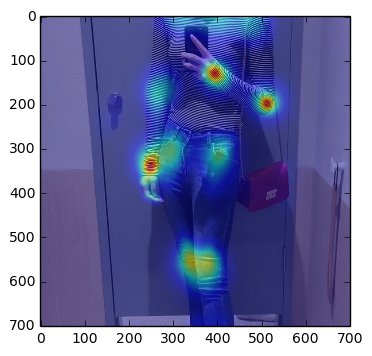

In [12]:
import scipy
print heatmap_avg.shape

#plt.imshow(heatmap_avg[:,:,2])
from scipy.ndimage.filters import gaussian_filter
all_peaks = []
peak_counter = 0

for part in range(19-1):
    x_list = []
    y_list = []
    map_ori = heatmap_avg[:,:,part]
    map = gaussian_filter(map_ori, sigma=3)
    
    map_left = np.zeros(map.shape)
    map_left[1:,:] = map[:-1,:]
    map_right = np.zeros(map.shape)
    map_right[:-1,:] = map[1:,:]
    map_up = np.zeros(map.shape)
    map_up[:,1:] = map[:,:-1]
    map_down = np.zeros(map.shape)
    map_down[:,:-1] = map[:,1:]
    
    peaks_binary = np.logical_and.reduce((map>=map_left, map>=map_right, map>=map_up, map>=map_down))
    peaks = zip(np.nonzero(peaks_binary)[1], np.nonzero(peaks_binary)[0]) # note reverse
    peaks_with_score = [x + (map_ori[x[1],x[0]],) for x in peaks]
    id = range(peak_counter, peak_counter + len(peaks))
    peaks_with_score_and_id = [peaks_with_score[i] + (id[i],) for i in range(len(id))]

    all_peaks.append(peaks_with_score_and_id)
    peak_counter += len(peaks)
    plt.imshow(oriImg[:,:,[2,1,0]])
#     plt.imshow(map, alpha=.5)
    if part ==0:
        show_map = map
    else :
        show_map +=map
    
#     print peaks_binary 
    print np.nonzero(peaks_binary)
    print peaks
    print peaks_with_score
    print id
    print peaks_with_score_and_id
    print "==============================================="
plt.imshow(show_map, alpha=.5)
#     if part==3:
#         #plt.imshow(map)
#         plt.imshow(oriImg[:,:,[2,1,0]])
#         plt.imshow(map, alpha=.5)
#         print peaks_with_score_and_id

In [12]:
# find connection in the specified sequence, center 29 is in the position 15
limbSeq = [[2,3], [2,6], [3,4], [4,5], [6,7], [7,8], [2,9], [9,10], \
           [10,11], [2,12], [12,13], [13,14], [2,1], [1,15], [15,17], \
           [1,16], [16,18], [3,17], [6,18]]
# the middle joints heatmap correpondence
mapIdx = [[31,32], [39,40], [33,34], [35,36], [41,42], [43,44], [19,20], [21,22], \
          [23,24], [25,26], [27,28], [29,30], [47,48], [49,50], [53,54], [51,52], \
          [55,56], [37,38], [45,46]]


In [14]:
f6, axarr6 = plt.subplots(19,4)
f6.set_size_inches((20, 200))
f6.subplots_adjust(wspace=0)
for i in range(len(mapIdx)):
    #paf_map = paf_avg[:,:,[x-19 for x in mapIdx[k]]]
    candA = limbSeq[i][0]-1
    candB = limbSeq[i][1]-1
 
    paf_idx_x = mapIdx[i][0]-19
    paf_idx_y = mapIdx[i][1]-19
    axarr6.flat[i*4+0].imshow(oriImg[:,:,[2,1,0]])
    axarr6.flat[i*4+0].imshow(paf_avg[:,:,paf_idx_x], alpha=.5)
    axarr6.flat[i*4+0].set_title(str(i)+"_x component")
    axarr6.flat[i*4+1].imshow(oriImg[:,:,[2,1,0]])
    axarr6.flat[i*4+1].imshow(paf_avg[:,:,paf_idx_y], alpha=.5)
    axarr6.flat[i*4+1].set_title(str(i)+"_y component")
    axarr6.flat[i*4+2].imshow(oriImg[:,:,[2,1,0]])
    axarr6.flat[i*4+2].imshow(heatmap_avg[:,:,candA], alpha=.5)
    axarr6.flat[i*4+2].set_title(body_str[candA])
    axarr6.flat[i*4+3].imshow(oriImg[:,:,[2,1,0]])
    axarr6.flat[i*4+3].imshow(heatmap_avg[:,:,candB], alpha=.5)
    axarr6.flat[i*4+3].set_title(body_str[candB])
plt.show()


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [13]:
connection_all = []
special_k = []
mid_num = 10

for k in range(len(mapIdx)):
    score_mid = paf_avg[:,:,[x-19 for x in mapIdx[k]]]
    candA = all_peaks[limbSeq[k][0]-1]
    candB = all_peaks[limbSeq[k][1]-1]
    nA = len(candA)
    nB = len(candB)
    indexA, indexB = limbSeq[k]
    if(nA != 0 and nB != 0):
        connection_candidate = []
        for i in range(nA):
            for j in range(nB):
                vec = np.subtract(candB[j][:2], candA[i][:2])
                norm = math.sqrt(vec[0]*vec[0] + vec[1]*vec[1])
                if norm ==0:
                    continue
                vec = np.divide(vec, norm)
                
                startend = zip(np.linspace(candA[i][0], candB[j][0], num=mid_num), \
                               np.linspace(candA[i][1], candB[j][1], num=mid_num))
                
                vec_x = np.array([score_mid[int(round(startend[I][1])), int(round(startend[I][0])), 0] \
                                  for I in range(len(startend))])
                vec_y = np.array([score_mid[int(round(startend[I][1])), int(round(startend[I][0])), 1] \
                                  for I in range(len(startend))])
                score_midpts = np.multiply(vec_x, vec[0]) + np.multiply(vec_y, vec[1])
                score_with_dist_prior = sum(score_midpts)/len(score_midpts) + min(0.5*oriImg.shape[0]/norm-1, 0)

                criterion1 = len(np.nonzero(score_midpts > param['thre2'])[0]) > 0.8 * len(score_midpts)
                criterion2 = score_with_dist_prior > 0
                if criterion1 and criterion2:
                    connection_candidate.append([i, j, score_with_dist_prior, score_with_dist_prior+candA[i][2]+candB[j][2]])

        connection_candidate = sorted(connection_candidate, key=lambda x: x[2], reverse=True)
        connection = np.zeros((0,5))
        for c in range(len(connection_candidate)):
            i,j,s = connection_candidate[c][0:3]
            if(i not in connection[:,3] and j not in connection[:,4]):
                connection = np.vstack([connection, [candA[i][3], candB[j][3], s, i, j]])
                if(len(connection) >= min(nA, nB)):
                    break
        print connection

        connection_all.append(connection)
    else:
        special_k.append(k)
        connection_all.append([])

[[ 0.          1.          0.26345137  0.          0.        ]]
[[ 0.          7.          0.23104692  0.          0.        ]]
[[ 1.          3.          0.34878831  0.          0.        ]
 [ 2.          4.          0.17894133  1.          1.        ]]
[[ 3.          5.          0.57184474  0.          0.        ]
 [ 4.          6.          0.2231942   1.          1.        ]]
[[ 7.          8.          0.32497535  0.          0.        ]]
[[ 8.         9.         0.8183292  0.         0.       ]]
[[  0.          10.           0.26355719   0.           0.        ]]
[[ 10.          11.           0.74854297   0.           0.        ]]
[[  0.         12.          0.2908637   0.          0.       ]]
[[ 12.          13.           0.60912612   0.           0.        ]]


In [14]:
# last number in each row is the total parts number of that person
# the second last number in each row is the score of the overall configuration
subset = -1 * np.ones((0, 20))
candidate = np.array([item for sublist in all_peaks for item in sublist])

for k in range(len(mapIdx)):
    print k, special_k
    if k not in special_k:
        partAs = connection_all[k][:,0]
        partBs = connection_all[k][:,1]
        indexA, indexB = np.array(limbSeq[k]) - 1
        print partAs, partBs
        print indexA, indexB
        for i in range(len(connection_all[k])): #= 1:size(temp,1)
            found = 0
            subset_idx = [-1, -1]
            for j in range(len(subset)): #1:size(subset,1):
                if subset[j][indexA] == partAs[i] or subset[j][indexB] == partBs[i]:
                    subset_idx[found] = j
                    found += 1
            print subset_idx
            print found
#             assert False
            
            if found == 1:
                j = subset_idx[0]
                if(subset[j][indexB] != partBs[i]):
                    subset[j][indexB] = partBs[i]
                    subset[j][-1] += 1
                    subset[j][-2] += candidate[partBs[i].astype(int), 2] + connection_all[k][i][2]
            elif found == 2: # if found 2 and disjoint, merge them
                j1, j2 = subset_idx
                print "found = 2"
                membership = ((subset[j1]>=0).astype(int) + (subset[j2]>=0).astype(int))[:-2]
                if len(np.nonzero(membership == 2)[0]) == 0: #merge
                    subset[j1][:-2] += (subset[j2][:-2] + 1)
                    subset[j1][-2:] += subset[j2][-2:]
                    subset[j1][-2] += connection_all[k][i][2]
                    subset = np.delete(subset, j2, 0)
                else: # as like found == 1
                    subset[j1][indexB] = partBs[i]
                    subset[j1][-1] += 1
                    subset[j1][-2] += candidate[partBs[i].astype(int), 2] + connection_all[k][i][2]

            # if find no partA in the subset, create a new subset
            elif not found and k < 17:
                row = -1 * np.ones(20)
                row[indexA] = partAs[i]
                row[indexB] = partBs[i]
                row[-1] = 2
                row[-2] = sum(candidate[connection_all[k][i,:2].astype(int), 2]) + connection_all[k][i][2]
                subset = np.vstack([subset, row])

0 [8, 11, 12, 13, 14, 15, 16, 17, 18]
[ 0.] [ 1.]
1 2
[-1, -1]
0
1 [8, 11, 12, 13, 14, 15, 16, 17, 18]
[ 0.] [ 7.]
1 5
[0, -1]
1
2 [8, 11, 12, 13, 14, 15, 16, 17, 18]
[ 1.  2.] [ 3.  4.]
2 3
[0, -1]
1
[-1, -1]
0
3 [8, 11, 12, 13, 14, 15, 16, 17, 18]
[ 3.  4.] [ 5.  6.]
3 4
[0, -1]
1
[1, -1]
1
4 [8, 11, 12, 13, 14, 15, 16, 17, 18]
[ 7.] [ 8.]
5 6
[0, -1]
1
5 [8, 11, 12, 13, 14, 15, 16, 17, 18]
[ 8.] [ 9.]
6 7
[0, -1]
1
6 [8, 11, 12, 13, 14, 15, 16, 17, 18]
[ 0.] [ 10.]
1 8
[0, -1]
1
7 [8, 11, 12, 13, 14, 15, 16, 17, 18]
[ 10.] [ 11.]
8 9
[0, -1]
1
8 [8, 11, 12, 13, 14, 15, 16, 17, 18]
9 [8, 11, 12, 13, 14, 15, 16, 17, 18]
[ 0.] [ 12.]
1 11
[0, -1]
1
10 [8, 11, 12, 13, 14, 15, 16, 17, 18]
[ 12.] [ 13.]
11 12
[0, -1]
1
11 [8, 11, 12, 13, 14, 15, 16, 17, 18]
12 [8, 11, 12, 13, 14, 15, 16, 17, 18]
13 [8, 11, 12, 13, 14, 15, 16, 17, 18]
14 [8, 11, 12, 13, 14, 15, 16, 17, 18]
15 [8, 11, 12, 13, 14, 15, 16, 17, 18]
16 [8, 11, 12, 13, 14, 15, 16, 17, 18]
17 [8, 11, 12, 13, 14, 15, 16, 17, 18]
1

In [15]:
print subset

[[ -1.           0.           1.           3.           5.           7.
    8.           9.          10.          11.          -1.          12.
   13.          -1.          -1.          -1.          -1.          -1.
    8.64052873  11.        ]
 [ -1.          -1.           2.           4.           6.          -1.
   -1.          -1.          -1.          -1.          -1.          -1.
   -1.          -1.          -1.          -1.          -1.          -1.
    0.90534048   3.        ]]


In [16]:
# delete some rows of subset which has few parts occur
deleteIdx = [];
for i in range(len(subset)):
    if subset[i][-1] < 4 or subset[i][-2]/subset[i][-1] < 0.4:
        deleteIdx.append(i)
subset = np.delete(subset, deleteIdx, axis=0)

In [17]:
print subset

[[ -1.           0.           1.           3.           5.           7.
    8.           9.          10.          11.          -1.          12.
   13.          -1.          -1.          -1.          -1.          -1.
    8.64052873  11.        ]]


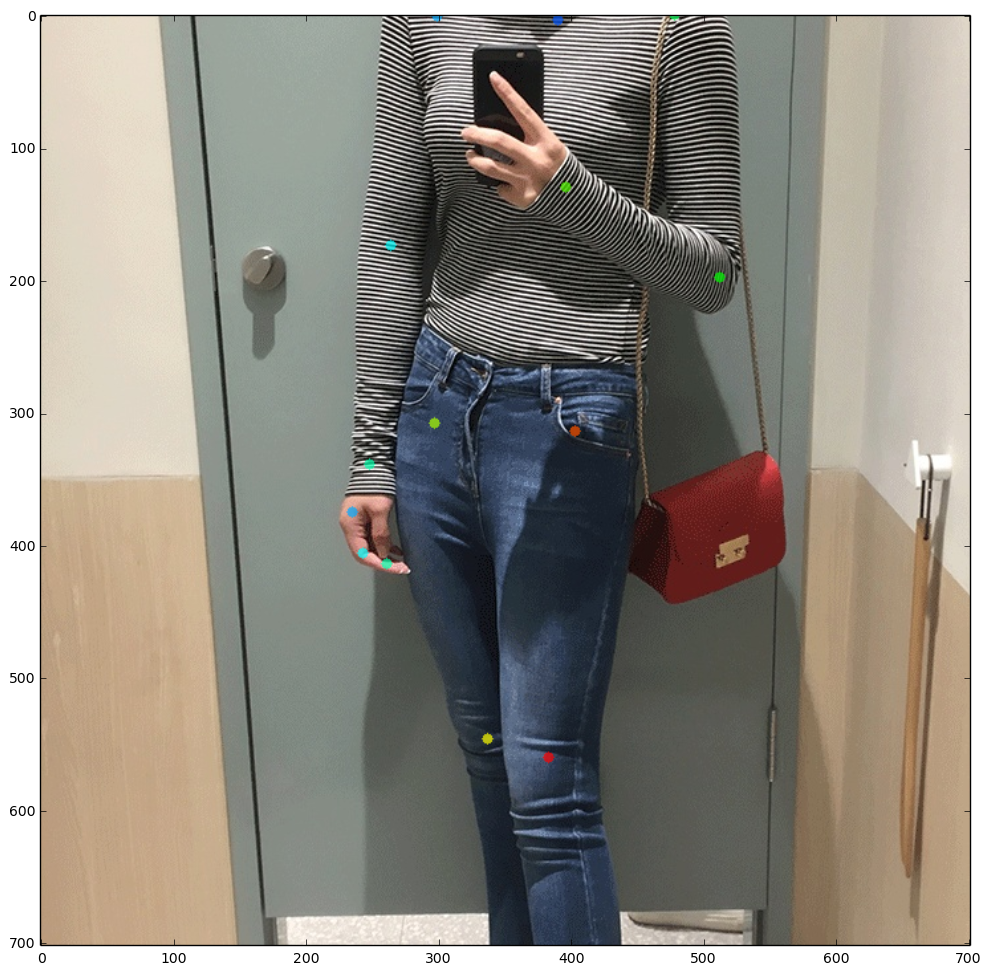

In [18]:
# visualize
colors = [[255, 0, 0], [255, 85, 0], [255, 170, 0], [255, 255, 0], [170, 255, 0], [85, 255, 0], [0, 255, 0], \
          [0, 255, 85], [0, 255, 170], [0, 255, 255], [0, 170, 255], [0, 85, 255], [0, 0, 255], [85, 0, 255], \
          [170, 0, 255], [255, 0, 255], [255, 0, 170], [255, 0, 85]]
cmap = matplotlib.cm.get_cmap('hsv')

canvas = cv.imread(test_image) # B,G,R order

for i in range(18):
    rgba = np.array(cmap(1 - i/18. - 1./36))
    rgba[0:3] *= 255
    for j in range(len(all_peaks[i])):
        cv.circle(canvas, all_peaks[i][j][0:2], 4, colors[i], thickness=-1)

to_plot = cv.addWeighted(oriImg, 0.3, canvas, 0.7, 0)
plt.imshow(to_plot[:,:,[2,1,0]])
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(12, 12)

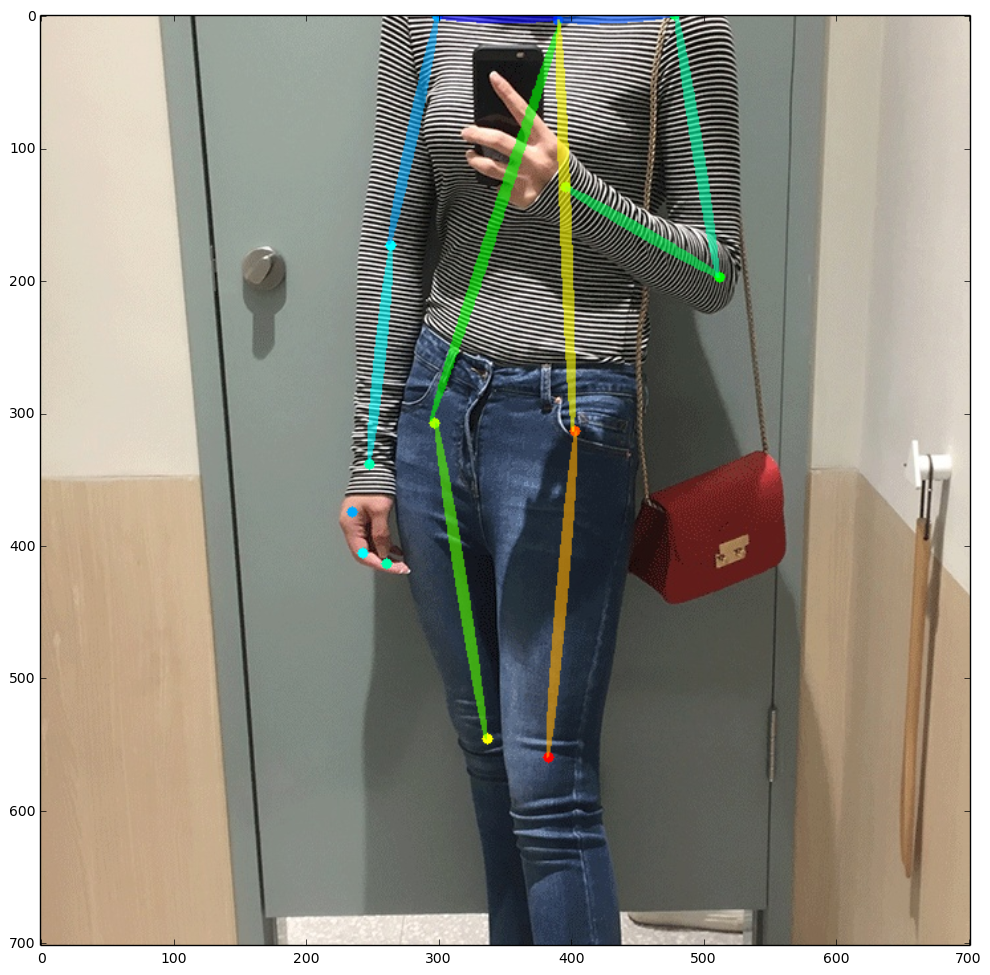

In [19]:
# visualize 2
stickwidth = 4

for i in range(17):
    for n in range(len(subset)):
        index = subset[n][np.array(limbSeq[i])-1]
        if -1 in index:
            continue
        cur_canvas = canvas.copy()
        Y = candidate[index.astype(int), 0]
        X = candidate[index.astype(int), 1]
        mX = np.mean(X)
        mY = np.mean(Y)
        length = ((X[0] - X[1]) ** 2 + (Y[0] - Y[1]) ** 2) ** 0.5
        angle = math.degrees(math.atan2(X[0] - X[1], Y[0] - Y[1]))
        polygon = cv.ellipse2Poly((int(mY),int(mX)), (int(length/2), stickwidth), int(angle), 0, 360, 1)
        cv.fillConvexPoly(cur_canvas, polygon, colors[i])
        canvas = cv.addWeighted(canvas, 0.4, cur_canvas, 0.6, 0)
        
plt.imshow(canvas[:,:,[2,1,0]])
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(12, 12)